<a href="https://colab.research.google.com/github/lacastanop/se-alesys/blob/main/Parcial_3_2024_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Parcial 3 - Señales y Sistemas 2024-1
Laura Sofía Castaño Pineda
 \


##Pregunta #1

Encuentre la funcion de transferencia que caracteriza el sistema masa, resorte, amortiguador, presentado en la siguiente Figura (asuma condiciones iniciales cero):

![Péndulo Elástico Amortiguado](https://github.com/amalvarezme/SenalesSistemas/blob/master/4_Transformada_Laplace/damped_spring.png?raw=1)

Luego, encuentre el sistema equivalente a partir de un circuito RLC (entrada de tension - salida tensión del capacitor).
Finalmente, desde el modelado desarrollado, presente un dashboard que permita simular el sistema como subamortiguado, con amortiguamiento crítico, sobreamortiguado, oscilatorio e inestable. El usuario podra determinar el valor del factor de amortiguamiento y la simulacion debería determinar los valores de m, k y c y sus equivalentes R, L y C; ademas de estimar el tipo de amortiguamiento. Asimismo, debera presentar las gráficas de polos y ceros, diagrama de Bode, respuesta impulso y respuesta al escalon.
Nota: Para las graficas de Bode, respuesta impulso y respuesta al escalon, se sugiere utilizar la API de control de Sympy,

##Solución

La ecuación diferencia del sistema mecánico se obtiene al considerar el equilibrio de fuerzas ejercidas sobre la masa:

\begin{equation}
F_\text{S}(t) + F_\text{F}(t) + F_\text{I}(t) = F_\text{E}(t)
\end{equation}

- Donde $F_\text{E}(t) $ denota una fuerza externa que actúa sobre la masa. La fuerza $F_\text{S}(t)$ inducida por el resorte está dada por la ley de Hooke
- Es común modelar la fuerza de fricción $F_\text{F}(t)$ inducida por el amortiguador de manera proporcional a la velocidad de la masa
- La fuerza inercial $F_\text{I}(t)$ debida a la aceleración de la masa se da como  \begin{equation}
F_\text{I}(t) = m \frac{d^2 y(t)}{dt^2}
\end{equation}

Al introducir las fuerzas anteriormente halladas en el equilibrio de fuerzas se obtiene la ecuación diferencial que describe el desplazamiento del péndulo elástico amortiguado

\begin{equation}
m \frac{d^2 y(t)}{dt^2} + c \frac{d y(t)}{dt} + k y(t) = F_\text{E}(t)
\end{equation}

Como consecuencia de la fuerza externa.

La ecuación anterior constituye una EDO con coeficientes constantes. Puede interpretarse como un SLTI con la fuerza externa $x(t)=F_\text{E}(t)$ como señal de entrada y el desplazamiento de la masa como la señal de salida $y(t)$ y la función de transferencia se obtiene al introducir $x(t)$ y $y(t)$ en la EDO y resolver para $H(s)$
\begin{equation}
H(s) = \frac{y(s)}{F_\text{E}(s)}= \frac{1}{ms^2+cs+k}
\end{equation}

Sabemos que para un circuito RLC serie la función de transferencia es:
\begin{equation}
H(s) = \frac{Vin(s)}{Vout(s)}= \frac{1}{LCs^2+CS+1}
\end{equation}

Como son equivalentes se relacionan a traves de sus coeficientes \
$b_\text{0}$ = k      -->    $b_\text{0}$ = 1\
$b_\text{1}$ = c      -->    $b_\text{1}$ = RC\
$b_\text{2}$ = m      -->    $b_\text{2}$ = LC

In [ ]:
!pip install sympy --upgrade

In [ ]:
import sympy as sym
import matplotlib.pyplot as plt
import sympy.physics.control as control

# Inicialización de la impresión de expresiones simbólicas
sym.init_printing()

# Definir las variables simbólicas
s = sym.symbols('s', complex=True)  # Variable de Laplace
t, R, L, C = sym.symbols('t R L C', positive=True)  # Tiempo y parámetros del circuito RLC

# Entrada de interés en Laplace
X = 1/s  # Ajustar según el tipo de entrada (por ejemplo, entrada escalón)

# Definir la función de transferencia para el circuito RLC
H = control.TransferFunction(1, L*C*s**2 + R*C*s + 1, s)  # Función de transferencia del circuito

# Multiplicamos la función de transferencia por la entrada
Y = H.num * X / H.den

# Función de salida en Laplace factorizada (fracciones parciales)
Yp = Y.apart(s)  # Factorización de fracciones parciales
print("Función de salida factorizada en fracciones parciales (Laplace):")
sym.pprint(Yp)

# Modelo en el tiempo en función de los componentes RLC
Ye = Yp
yt = 0  # Iniciar la variable para la solución temporal
for j in range(len(Ye.args)):
    if j == 0:
        yt = sym.inverse_laplace_transform(Ye.args[j], s, t)
    else:
        yt += sym.inverse_laplace_transform(Ye.args[j], s, t)

print("\nFunción de salida en el tiempo (solución general):")
sym.pprint(yt)

# Evaluar la función en valores numéricos para R, L, C
RLC = {R: 1, L: sym.Rational('.5'), C: sym.Rational('.4')}  # Valores utilizados para la simulación
Ye_evaluated = Yp.subs(RLC)

# Calcular la función inversa de Laplace con los valores numéricos
yt_evaluated = 0
for j in range(len(Ye_evaluated.args)):
    if j == 0:
        yt_evaluated = sym.inverse_laplace_transform(Ye_evaluated.args[j], s, t)
    else:
        yt_evaluated += sym.inverse_laplace_transform(Ye_evaluated.args[j], s, t)

print("\nFunción de salida en el tiempo con valores evaluados para R, L, C:")
sym.pprint(yt_evaluated)

# Diagrama de polos y ceros utilizando la API de control de Sympy
HRLC = control.TransferFunction(H.num, H.den.subs(RLC), s)  # Función de transferencia evaluada
control.pole_zero_plot(HRLC)


In [ ]:
# Diagrama de Bode
control.bode_plot(HRLC)

In [ ]:
# Respuestas el circuito a impulso y escalón
# Respuesta al impulso
control.impulse_response_plot(HRLC)

# Respuesta al escalón
control.step_response_plot(HRLC)

##Pregunta 2
\
 \

- Base de datos para el entrenamiento del sistema

In [ ]:
!python3 -m pip install --force-reinstall https://github.com/yt-dlp/yt-dlp/archive/master.tar.gz

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 9.9 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached certifi-2024.8.30-py3-none-any.whl.metadata (2.2 kB)
  Using cached requests-2.32.3-py3-none-any.whl.metadata (4.6 kB)
  Using cached urllib3-2.2.3-py3-none-any.whl.metadata (6.5 kB)
  Using cached charset_normalizer-3.3.2-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (33 kB)
  Using cached idna-3.10-py3-none-any.whl.metadata (10 kB)
Using cached requests-2.32.3-py3-none-any.whl (64 kB)
Using cached certifi-2024.8.30-py3-none-any.whl (167 kB)
Using cached urllib3-2.2.3-py3-none-any.whl (126 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 164.1/164.1 kB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 38.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.4/194.4 kB 12.8 MB/s eta 0:00:00
   ━━━━━━━━━

In [ ]:
import os
import yt_dlp as youtube_dl
def download_ytvid_as_mp3(video_url,name):
    #video_url = input("enter url of youtube video:")
    video_info = youtube_dl.YoutubeDL().extract_info(url = video_url,download=False)
    filename = f"{name}.mp3"
    options={
        'format':'bestaudio/best',
        'keepvideo':False,
        'outtmpl':filename,
    }

    with youtube_dl.YoutubeDL(options) as ydl:
        ydl.download([video_info['webpage_url']])

    print("Download complete... {}".format(filename))

In [ ]:
#30 canciones, 10 de cada género
#Vallenato
link_= ["https://www.youtube.com/watch?v=itquaX8gH34",
       "https://www.youtube.com/watch?v=EAm1d6I_iDw",
       "https://www.youtube.com/watch?v=SW2aJ7NH3is",
       "https://www.youtube.com/watch?v=SKV6zQyeJeo",
       "https://www.youtube.com/watch?v=tIZCwqx8bUE",
       "https://www.youtube.com/watch?v=30OtPy7PW0g",
       "https://www.youtube.com/watch?v=FU-7mHUTJKk",
       "https://www.youtube.com/watch?v=8GHExewfixM",
       "https://www.youtube.com/watch?v=1rFNoZaxhG4",
       "https://www.youtube.com/watch?v=elCjRzvm5Hs",
#Reggae
        "https://www.youtube.com/watch?v=a5fHoAx12DY",
        "https://www.youtube.com/watch?v=odQRCrCFW04",
        "https://www.youtube.com/watch?v=lWKaMeJRiik",
        "https://www.youtube.com/watch?v=M3geA7B4Y2Q",
        "https://www.youtube.com/watch?v=QuNz2b8RUp4",
        "https://www.youtube.com/watch?v=v788XXX8qdk",
        "https://www.youtube.com/watch?v=TBapnUC865M",
        "https://www.youtube.com/watch?v=oyRFUI8Qg0Q",
        "https://www.youtube.com/watch?v=AQ4TW5Z8eu0",
        "https://www.youtube.com/watch?v=dW2MmuA1nI4",

#Ranchera
        "https://www.youtube.com/watch?v=_p-W0icDaSY",
        "https://www.youtube.com/watch?v=gfm2zSgQ8cQ",
        "https://www.youtube.com/watch?v=xa2GLqL12Zk",
        "https://www.youtube.com/watch?v=YOIavOWa6po",
        "https://www.youtube.com/watch?v=hS5iEP8SUKw",
        "https://www.youtube.com/watch?v=PVb6IHmsQX4",
        "https://www.youtube.com/watch?v=rKvAnlRgBs0",
        "https://www.youtube.com/watch?v=ba3Aq_dBiUc",
        "https://www.youtube.com/watch?v=Xl1Kr9BFuK0",
        "https://www.youtube.com/watch?v=wVXLd8G9-JM"
       ]
name_ = ['Que vuelva',
         'Que No Me Faltes Tú',
         'Busca Un Confidente',
         'Amarte Más No Pude',
         'Tú Eres La Reina',
         'Ese Muchacho',
         'La Suerte Está Echada',
         'Me Vas A Extrañar',
         'Quiero Que Seas MI Estrella',
         'Me Ilusioné',
         'Tú Sin Mí',
         'Nada',
         'Árbol Sin Hojas',
         'Sálvame',
         'Morena',
         'Comando',
         'Good Bye',
         'Agarra Mi Mano',
         "I'm Still In Love With You",
         'Temperature',
         'Un Millón de Primaveras',
         'Por Tu Maldito Amor',
         'Mujeres Divinas',
         'Qué de Raro Tiene',
         'Señor',
         'Maria De Los Guardias',
         'De Carne O Hueso',
         'Ángel O Demonio',
         'Si Supieras',
         'Unas Copas De Mas']
for name,link in zip(name_,link_):
    print(name)
    download_ytvid_as_mp3(link,name)

Que vuelva
[youtube] Extracting URL: https://www.youtube.com/watch?v=itquaX8gH34
[youtube] itquaX8gH34: Downloading webpage
[youtube] itquaX8gH34: Downloading ios player API JSON
[youtube] itquaX8gH34: Downloading web creator player API JSON
[youtube] itquaX8gH34: Downloading player d9418494
[youtube] itquaX8gH34: Downloading m3u8 information
[youtube] Extracting URL: https://www.youtube.com/watch?v=itquaX8gH34
[youtube] itquaX8gH34: Downloading webpage
[youtube] itquaX8gH34: Downloading ios player API JSON
[youtube] itquaX8gH34: Downloading web creator player API JSON
[youtube] itquaX8gH34: Downloading player d9418494
[youtube] itquaX8gH34: Downloading m3u8 information
[info] itquaX8gH34: Downloading 1 format(s): 251
[download] Destination: Que vuelva.mp3
[download] 100% of    4.67MiB in 00:00:00 at 5.78MiB/s   
Download complete... Que vuelva.mp3
Que No Me Faltes Tú
[youtube] Extracting URL: https://www.youtube.com/watch?v=EAm1d6I_iDw
[youtube] EAm1d6I_iDw: Downloading webpage
[youtu

In [ ]:
import subprocess

for name in name_:
    subprocess.call(['ffmpeg','-y', '-i', name+'.mp3',
                   name+'.wav'])

In [ ]:
#Libreria para manipulación de archivos de audio
!pip install soundfile

In [ ]:
import soundfile as sf
#lee archivos wav
for name in name_:
    nombre_out = "output.wav"
    x, fs = sf.read(name+'.wav')

    print('Frecuencia de muestreo %.2f[Hz]\naudio %s' % (fs,name+'.wav'))


Frecuencia de muestreo 48000.00[Hz]
audio Que vuelva.wav
Frecuencia de muestreo 48000.00[Hz]
audio Que No Me Faltes Tú.wav
Frecuencia de muestreo 48000.00[Hz]
audio Busca Un Confidente.wav
Frecuencia de muestreo 48000.00[Hz]
audio Amarte Más No Pude.wav
Frecuencia de muestreo 48000.00[Hz]
audio Tú Eres La Reina.wav
Frecuencia de muestreo 44100.00[Hz]
audio Ese Muchacho.wav
Frecuencia de muestreo 48000.00[Hz]
audio La Suerte Está Echada.wav
Frecuencia de muestreo 48000.00[Hz]
audio Me Vas A Extrañar.wav
Frecuencia de muestreo 48000.00[Hz]
audio Quiero Que Seas MI Estrella.wav
Frecuencia de muestreo 48000.00[Hz]
audio Me Ilusioné.wav
Frecuencia de muestreo 48000.00[Hz]
audio Tú Sin Mí.wav
Frecuencia de muestreo 48000.00[Hz]
audio Nada.wav
Frecuencia de muestreo 48000.00[Hz]
audio Árbol Sin Hojas.wav
Frecuencia de muestreo 48000.00[Hz]
audio Sálvame.wav
Frecuencia de muestreo 48000.00[Hz]
audio Morena.wav
Frecuencia de muestreo 48000.00[Hz]
audio Comando.wav
Frecuencia de muestreo 48000.0

In [ ]:
from IPython.display import Audio
ns = 60 #se reproducen los primeros ns segundos
Audio(x[:int(fs*ns),:].T,rate=fs)

##MODULACIÓN DE CANCIÓN

Descarga desde youtube 5 segundos de su cancion favorita. Presente una simulación de modulacion por amplitud AM (tomando como mensaje el fragmento de la cancion escogida). Grafique las señales en tiempo y frecuencia (magnitud y fase) de la senal mensaje, portadora y modulada.

In [ ]:
#Canción descargada de youtube

#Se debe incluir el enlace del video a procesar
link="https://www.youtube.com/watch?v=544X2PIxCIc&ab_channel=vicentefernandezVEVO"
!yt-dlp --extract-audio -o "audio" --audio-format mp3 {link}

[youtube] Extracting URL: https://www.youtube.com/watch?v=544X2PIxCIc
[youtube] 544X2PIxCIc: Downloading webpage
[youtube] 544X2PIxCIc: Downloading ios player API JSON
[youtube] 544X2PIxCIc: Downloading web creator player API JSON
[youtube] 544X2PIxCIc: Downloading m3u8 information
[info] 544X2PIxCIc: Downloading 1 format(s): 251
[download] Destination: audio
[download] 100% of    2.79MiB in 00:00:00 at 20.14MiB/s
[ExtractAudio] Destination: audio.mp3
Deleting original file audio (pass -k to keep)


In [ ]:
#Se convierte a formato WAV para permitir el procesamiento
!ffmpeg -y -i audio.mp3 output.wav

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [ ]:
#lee archivos wav
nombre_out = "output.wav"
x, fs = sf.read(nombre_out)

if x.ndim > 1:
    x = np.mean(x, axis=1)

# Extraer los 5 segundos desde los 20 a los 25 segundos
start_sample = int(20 * fs)
end_sample = int(25 * fs)
x_fragment = x[start_sample:end_sample]

# read speech signal from file
print('Frecuencia de muestreo %.2f[Hz]\naudio %s' % (fs,nombre_out))


#Reproducir el fragmento seleccionado
from IPython.display import Audio
Audio(x_fragment, rate=fs)

Frecuencia de muestreo 48000.00[Hz]
audio output.wav


In [ ]:
#Modulacion por amplitud AM
#Ingreso del indice de modulación

import matplotlib.pyplot as plt
#parámetros de la portadora
Fc = 10000  #frecuencia de la portadora
Im = float(input("Ingrese el índice de modulación: ")) #Im = peak(m(t))/Ac ->  Ac = peak(m(t))/Im

Fs = 5 * Fc #frecuencia de muestreo
t = np.arange(len(x_fragment)) / fs #vector del tiempo
m = x_fragment / np.max(np.abs(x_fragment)) #normalizar el fragmento de audio -> Mensaje
Ac = np.max(np.abs(m)) / Im #amplitud de la portadora según índice de modulación
c = Ac * np.sin(2 * np.pi * Fc * t)  #portadora

print(Ac)

Ingrese el índice de modulación: 1
1.0


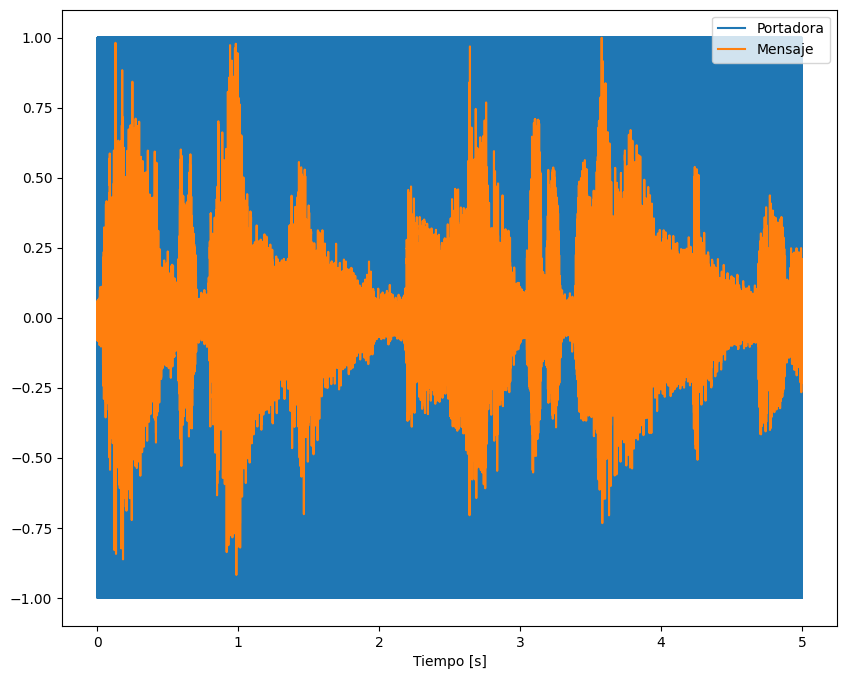

In [ ]:
#Graficas en tiempo y frecuencia

# Graficar la señal portadora y el mensaje
plt.figure(figsize=(10, 8))
plt.plot(t, c, label='Portadora')
plt.plot(t, m, label='Mensaje')
plt.legend()
plt.xlabel('Tiempo [s]')
plt.show()

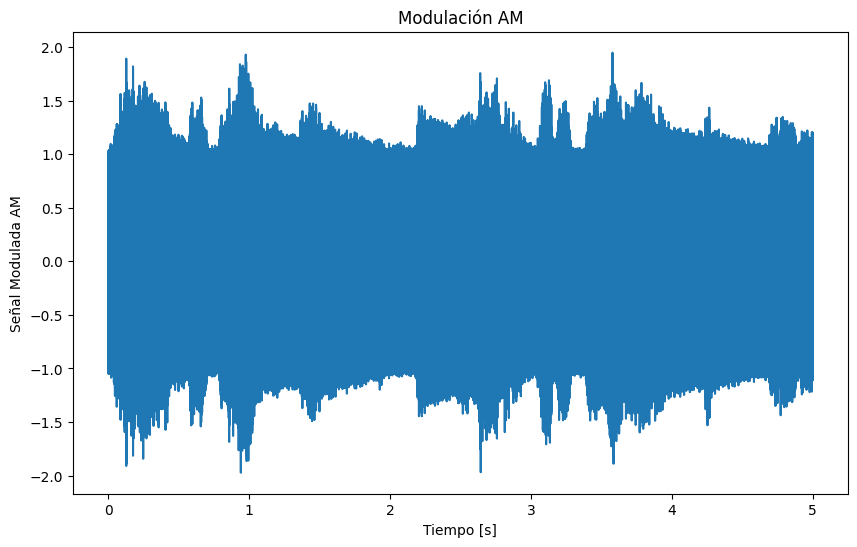

In [ ]:
# Señal modulada en AM
y = (1 + m / Ac) * c

# Graficar la señal modulada
plt.figure(figsize=(10, 6))
plt.plot(t, y)
plt.xlabel('Tiempo [s]')
plt.ylabel('Señal Modulada AM')
plt.title('Modulación AM')
plt.show()

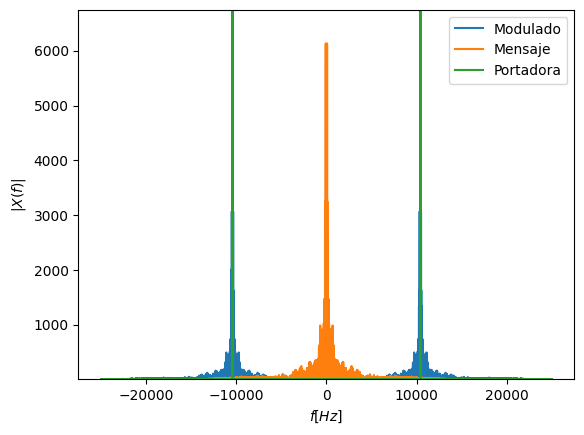

In [ ]:
#Se presenta el espectro de la señal mensaje, portadora y modulada

Xfc = np.fft.fft(c)
Xfm = np.fft.fft(m)
Xfy = np.fft.fft(y)

vfre = np.fft.fftfreq(len(c),1/Fs)

plt.plot(vfre,abs(Xfy),label='Modulado')
plt.plot(vfre,abs(Xfm),label='Mensaje')
plt.plot(vfre,abs(Xfc),label='Portadora')
plt.legend()
plt.xlabel('$f [Hz]$')
plt.ylabel('$|X(f)|$')
plt.ylim([min(abs(Xfm)), 1.1*max(abs(Xfm))])
plt.show()

In [ ]:
#Fragmentos de Audio

#Reproducir la señal mensaje
print("Señal mensaje")
Audio(x_fragment, rate=fs)

Señal mensaje


In [ ]:
#Reproducir la señal portadora
print("Señal portadora")
Audio(c, rate=fs)

Señal portadora


In [ ]:
#Reproducir la señal modulada
print("Señal modulada")
Audio(y, rate=fs)

Señal modulada


- A partir del esquema de la siguiente figura:

![Sistema](https://github.com/lacastanop/se-alesys/blob/main/Sistema_Lasoabierto.PNG)

Asumiendo θ = 0, presente una simulacion sobre Python para el proceso de demodulacion en amplitud. Especifique adecuadamente las consideraciones de diseño en tiempo y en frecuencia (con las graficas pertinentes), y reproduzca el segmento de la canción para cada una de las etapas del sistema de modulacion y demodulación. Tenga en cuenta el diseño de un filtro digital pasa bajas en la etapa de demodulacion, utilizando Transformada Z. Presente la grafica de polos y ceros y el diagrama de Bode del filtro

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
from scipy.fft import fft, fftfreq
from scipy.signal import freqz

# Parámetros de la portadora
Fc = 10000  # Frecuencia de la portadora
Fs = 5 * Fc  # Frecuencia de muestreo
t = np.arange(len(x_fragment)) / fs  # vector de tiempo

# Señal modulada (DSB-SC)
y = (1 + m / Ac) * c  # La señal modulada que ya tienes

# Demodulación (mezcla con la portadora)
# Asumiendo θ = 0 como en la figura
y_demod = y * np.cos(2 * np.pi * Fc * t)  # Multiplicación con la portadora

# Diseño del filtro pasa bajas
cutoff = Fc / 2  # Frecuencia de corte del filtro (menor que la portadora)
order = 4  # Orden del filtro
b, a = signal.butter(order, cutoff / (Fs / 2), btype='low', analog=False)

# Aplicar el filtro pasa bajas a la señal demodulada
y_filtered = signal.filtfilt(b, a, y_demod)

# Escalamiento según la figura para recuperar la señal original
A1 = np.max(np.abs(y_filtered))  # Estimación de la amplitud de la señal modulada
m_recovered = 2 * y_filtered / A1  # Recuperamos el mensaje escalando adecuadamente


In [ ]:
# Graficar la señal demodulada
t = np.arange(len(m_recovered)) / fs
plt.figure(figsize=(10, 6))
plt.plot(t, m_recovered)
plt.xlabel('Tiempo [s]')
plt.ylabel('Señal Demodulada (Mensaje Recuperado)')
plt.title('Mensaje Recuperado Después de la Demodulación')
plt.show()

In [ ]:
# Reproducir el audio demodulado (mensaje recuperado)
from IPython.display import Audio
print("Mensaje recuperado")
Audio(m_recovered, rate=fs)

In [ ]:
# Gráfica de polos y ceros del filtro pasa bajas
z, p, k = signal.tf2zpk(b, a)
plt.figure(figsize=(6, 6))
plt.scatter(np.real(z), np.imag(z), marker='o', label='Ceros')
plt.scatter(np.real(p), np.imag(p), marker='x', label='Polos')
plt.xlabel('Parte Real')
plt.ylabel('Parte Imaginaria')
plt.title('Diagrama de Polos y Ceros del Filtro')
plt.legend()
plt.grid()
plt.show()

In [ ]:
# Diagrama de Bode del filtro pasa bajas
w, h = freqz(b, a, fs=Fs)
plt.figure(figsize=(10, 6))
plt.subplot(2, 1, 1)
plt.plot(w, 20 * np.log10(np.abs(h)))
plt.title('Respuesta en Frecuencia del Filtro Pasa Bajas')
plt.xlabel('Frecuencia [Hz]')
plt.ylabel('Magnitud [dB]')
plt.subplot(2, 1, 2)
plt.plot(w, np.angle(h))
plt.xlabel('Frecuencia [Hz]')
plt.ylabel('Fase [radianes]')
plt.show()

- DETECTOR DE GENERO MUSICAL (3 generos)

In [ ]:
#Detector de genero

import os
import numpy as np
import librosa
import librosa.display
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from google.colab import drive

# Ruta donde están almacenadas las canciones en Google Drive
music_folder = '/content'  # Ajusta esta ruta a la carpeta real

# Función para cargar canciones desde una carpeta
def load_songs_from_folder(folder_path, genres):
    X_train = []
    y_train = []

    # Recorrer cada género musical
    for genre in genres:
        genre_folder = os.path.join(folder_path, genre)

        # Recorrer los archivos de audio en la carpeta del género
        for filename in os.listdir(genre_folder):
            if filename.endswith(".wav"):  # Asegúrate de que sean archivos WAV
                filepath = os.path.join(genre_folder, filename)
                signal, sr = librosa.load(filepath, sr=None)  # Cargar el archivo de audio
                features = extract_features(signal, sr)  # Extraer características MFCC
                X_train.append(features)
                y_train.append(genre)  # Etiqueta según el género

    return np.array(X_train), np.array(y_train)

# Extraer características del audio (MFCCs)
def extract_features(signal, sr):
    mfccs = librosa.feature.mfcc(y=signal, sr=sr, n_mfcc=13)
    return np.mean(mfccs.T, axis=0)

# Función para entrenar el modelo de clasificación de género musical
def train_genre_classifier(X_train, y_train):
    # Escalar las características
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)

    # Entrenar el modelo SVM
    clf = SVC(kernel='linear')
    clf.fit(X_train_scaled, y_train)

    return clf, scaler

# Clasificación del género musical
def classify_genre(clf, scaler, signal, fs):
    features_test = extract_features(signal, fs)
    features_test_scaled = scaler.transform([features_test])
    predicted_genre = clf.predict(features_test_scaled)
    return predicted_genre[0]

# Definir los géneros que queremos clasificar
genres = ['Ranchera', 'Reggae', 'Vallenato']  # Asegúrate de que estos géneros coincidan con las carpetas

# Cargar las canciones desde Google Drive y entrenar el modelo
X_train, y_train = load_songs_from_folder(music_folder, genres)

# Entrenar el modelo
clf, scaler = train_genre_classifier(X_train, y_train)

# Prueba de clasificación con una nueva canción (se puede cambiar por un archivo de prueba)
test_song_path = '/content/output.wav'  # Ajusta esta ruta
test_signal, test_fs = librosa.load(test_song_path, sr=None)

# Clasificar el género de la nueva canción
predicted_genre = classify_genre(clf, scaler, test_signal, test_fs)
print(f"Género Detectado: {predicted_genre}")


Género Detectado: Ranchera
